# **Descripción del caso de negocio**

La industria aérea se caracteriza por una intensa competencia por lo que resulta de suma importancia conocer a los clientes, sus intereses y preferencias. Este trabajo se centra en analizar los datos de encuestas realizadas a pasajeros de una cierta aerolínea para evaluar distintos aspectos y cómo afectan en el nivel de satisfacción, para esto se utilizarán técnicas de Data Science.

# **Objetivos del modelo**

 El **objetivo general** del presente trabajo es predecir a través de un modelo de Machine Learning la satisfacción con la mayor asertividad posible, según ciertos contextos y analizar qué variables impactan con mayor correlación en la satisfacción, realizando el entrenamiento de un modelo predictivo

Se plantean como **objetivos específicos**: 
* Conocer las características y preferencias de los clientes de acuerdo al género, edad, tipo de cliente y clase de vuelo que utilizan. 
* Identificar cuáles son los servicios que deben mejorarse, y ver si se asocian a las características generales de los clientes 
* Analizar las características generales de los vuelos que tienen mayores inconvenientes (demoras en partida/arribo por ej), y  ver si la información recolectada es de utilidad para proponer soluciones a los mismos. 
* Desarrollar un modelo predictivo que permita identificar el nivel de satisfacción de los pasajeros respecto a los servicios brindados


# **Descripción de los datos**

Los datos se obtuvieron del repositorio www.kaggle.com. Se trata de una base de datos estructurados, generada a partir de encuestas realizadas a más de 100k clientes. La misma cuenta con campos que permiten describir las características generales  del cliente, como género, edad, tipo de viaje, categoría de pasajero, distancia del vuelo; como así también cuáles son las opiniones del mismo en relación a distintos aspectos del viaje. En este punto, utilizando escalas de Likert, se les consultó sobre distintos aspectos con el grado de satisfacción donde : 0 correspondía a variables donde la respuesta No Aplica, y los puntajes de 1 a 5 indican el nivel de  satisfacción de los pasajeros.

* Gender: Género de los pasajeros (variable categórica, “Female /Male”)
* Customer Type: tipo de cliente, categorizado como: “cliente leal” / “cliente desleal”) (Loyal customer, disloyal customer)
* Age: Edad actual de los pasajeros (variable numérica, en años)
* Type of Travel: Motivo del viaje de los pasajeros (variable categórica: Personal Travel /  Business Travel)
* Class: Tipo de clase en la que viajaban los pasajeros (variable categórica: Business / Eco / Eco Plus)
* Flight distance: Distancia recorrida en el viaje (variable numérica, en kilómetros)
* Inflight wifi service: Nivel de satisfacción respecto al servicio de wifi durante el vuelo (escala de likert) ( 
* Departure/Arrival time convenient: Nivel de satisfacción en relación a la conveniencia entre el tiempo de partida/arribo  (escala de likert)
* Ease of Online booking: Nivel de satisfacción respecto a la reserva online (escala de likert)
* Gate location: Nivel de satisfacción respecto a la ubicación de la puerta de embarque en el aeropuerto  (escala de likert)
* Food and drink: Nivel de satisfacción respecto a la comida y bebida (escala de likert)
* Online boarding: Nivel de satisfacción respecto a Satisfaction level of online boarding (escala de likert)
* Seat comfort: Nivel de satisfacción respecto a la comodidad de los asientos (escala de likert)
* Inflight entertainment: Nivel de satisfacción respecto al entretenimiento durante el vuelo (escala de likert)
* On-board service: Nivel de satisfacción respecto al servicio durante el vuelo (escala de likert)
* Leg room service: Nivel de satisfacción respecto al servicio de espacios para piernas Satisfaction level of Leg room service (escala de likert)
* Baggage handling: Nivel de satisfacción respecto al manejo del equipaje (escala de likert)
* Check-in service: Nivel de satisfacción respecto al servicio de check-in (escala de likert)
* Inflight service: Nivel de satisfacción respecto al servicio durante el vuelo (escala de likert)
* Cleanliness: Nivel de satisfacción respecto a la limpieza (escala de likert)
* Departure Delay in Minutes: minutos de demora en la partida  (variable numérica, en minutos)
* Arrival Delay in Minutes: minutos de demora en el arribo  (variable numérica, en minutos)
* Satisfaction: Nivel de satisfacción respecto a la aerolínea en general, medido como “satisfactorio” o “neutral / no satisfactorio”. 

# **Data Wrangling y EDA**

**Paquetes Numpy, Pandas, Matplotlib, Seaborn, Letsplot y Sklearn**

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
#Import Request 
import io
import requests
url = "https://github.com/jonezequiel92/Airline-Passenger-Satisfaction/raw/main/train.csv"
url_test = "https://github.com/jonezequiel92/Airline-Passenger-Satisfaction/raw/main/test.csv"
s=requests.get(url).content
s_test=requests.get(url_test).content
df=pd.read_csv(io.StringIO(s.decode('utf-8')))
df_test=pd.read_csv(io.StringIO(s_test.decode('utf-8')))

**Set Option**

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 20)
pd.set_option('display.float_format', lambda x: '%.2f' % x)

**Modelado de Datos**

In [ ]:
def transform_gender(x):
    if x == 'Female':
        return 1
    elif x == 'Male':
        return 0
    else:
        return -1
    
def transform_customer_type(x):
    if x == 'Loyal Customer':
        return 1
    elif x == 'disloyal Customer':
        return 0
    else:
        return -1
    
def transform_travel_type(x):
    if x == 'Business travel':
        return 1
    elif x == 'Personal Travel':
        return 0
    else:
        return -1
    
def transform_class(x):
    if x == 'Business':
        return 2
    elif x == 'Eco Plus':
        return 1
    elif x == 'Eco':
        return 0    
    else:
        return -1
    
def transform_satisfaction(x):
    if x == 'satisfied':
        return 1
    elif x == 'neutral or dissatisfied':
        return 0
    else:
        return -1
    
def process_data(df):
    df = df.drop(['Unnamed: 0', 'id'], axis = 1)
    df['trasnform_Gender'] = df['Gender'].apply(transform_gender)
    df['trasnform_Customer Type'] = df['Customer Type'].apply(transform_customer_type)
    df['trasnform_Type of Travel'] = df['Type of Travel'].apply(transform_travel_type)
    df['trasnform_Class'] = df['Class'].apply(transform_class)
    df['trasnform_satisfaction'] = df['satisfaction'].apply(transform_satisfaction)
    df['Arrival Delay in Minutes'].fillna(df['Arrival Delay in Minutes'].median(), inplace = True)
    
    return df

df = process_data(df)
df_test = process_data(df_test)

In [ ]:
#Columnas del Data Set
df.columns

Index(['Gender', 'Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction', 'trasnform_Gender', 'trasnform_Customer Type',
       'trasnform_Type of Travel', 'trasnform_Class',
       'trasnform_satisfaction'],
      dtype='object')

In [ ]:
#Casteo de object
df.convert_dtypes().dtypes

Gender                      string
Customer Type               string
Age                          Int64
Type of Travel              string
Class                       string
                             ...  
trasnform_Gender             Int64
trasnform_Customer Type      Int64
trasnform_Type of Travel     Int64
trasnform_Class              Int64
trasnform_satisfaction       Int64
Length: 28, dtype: object

In [ ]:
#Se constata la ausencia de Valores faltantes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 28 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  object 
 1   Customer Type                      103904 non-null  object 
 2   Age                                103904 non-null  int64  
 3   Type of Travel                     103904 non-null  object 
 4   Class                              103904 non-null  object 
 5   Flight Distance                    103904 non-null  int64  
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding                    1039

**Métrica, Funciones y Gráficos**

In [ ]:
df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,trasnform_Gender,trasnform_Customer Type,trasnform_Type of Travel,trasnform_Class,trasnform_satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.00,neutral or dissatisfied,0,1,0,1,0
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.00,neutral or dissatisfied,0,0,1,2,0
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.00,satisfied,1,1,1,2,1
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.00,neutral or dissatisfied,1,1,1,2,0
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.00,satisfied,0,1,1,2,1


In [ ]:
df.shape

(103904, 28)

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,103904.00,39.38,15.11,7.00,27.00,40.00,51.00,85.00
Flight Distance,103904.00,1189.45,997.15,31.00,414.00,843.00,1743.00,4983.00
Inflight wifi service,103904.00,2.73,1.33,0.00,2.00,3.00,4.00,5.00
Departure/Arrival time convenient,103904.00,3.06,1.53,0.00,2.00,3.00,4.00,5.00
Ease of Online booking,103904.00,2.76,1.40,0.00,2.00,3.00,4.00,5.00
...,...,...,...,...,...,...,...,...
trasnform_Gender,103904.00,0.51,0.50,0.00,0.00,1.00,1.00,1.00
trasnform_Customer Type,103904.00,0.82,0.39,0.00,1.00,1.00,1.00,1.00
trasnform_Type of Travel,103904.00,0.69,0.46,0.00,0.00,1.00,1.00,1.00
trasnform_Class,103904.00,1.03,0.96,0.00,0.00,1.00,2.00,2.00


# Gráficos

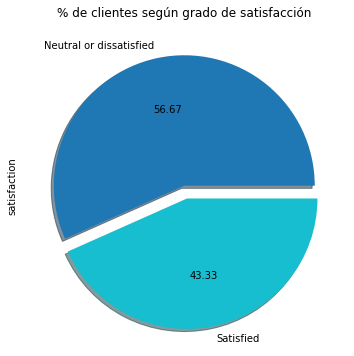

In [ ]:
#Gráfico de Satisfación
plt.figure(figsize=(6,6))
labels = 'Neutral or dissatisfied', 'Satisfied'
explode = (0, 0.1)

df_group = df.satisfaction.value_counts(normalize=True).mul(100)
df_group.plot.pie(autopct="%.2f", cmap='tab10', labels=labels,explode=explode ,shadow=True).set(title='% de clientes según grado de satisfacción')

plt.show()

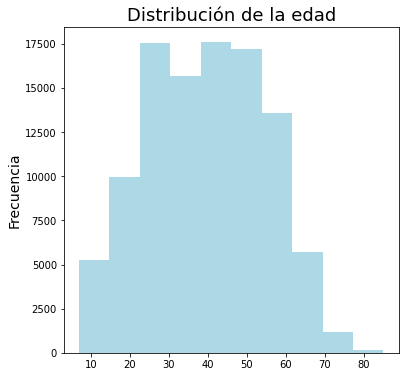

In [ ]:
#Gráfico Univariado
plt.figure(figsize=(6,6))
plt.hist(df['Age'], color='lightblue')
plt.title("Distribución de la edad",size=18)
plt.ylabel("Frecuencia",size=14)
plt.show()

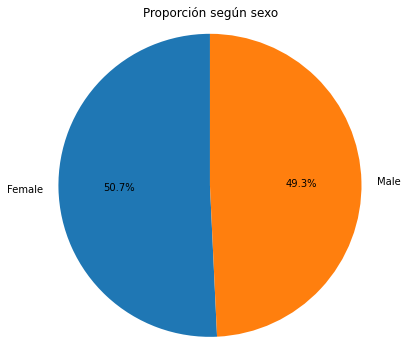

In [ ]:
# grafico para la conclusion 'La proporción de hombres y mujeres encuestados es similar.'
gender_perc = df.Gender.value_counts(normalize=True).mul(100)

fig, ax = plt.subplots(figsize=(6,6))
ax.pie(gender_perc, labels=gender_perc.index, autopct='%1.1f%%', startangle=90)
ax.axis('equal')  
plt.title("Proporción según sexo",size=12)

plt.show()

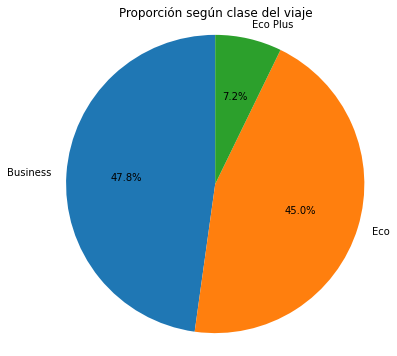

In [ ]:
class_perc = df['Class'].value_counts(normalize=True).mul(100)

fig, ax = plt.subplots(figsize=(6,6))
ax.pie(class_perc, labels=class_perc.index, autopct='%1.1f%%', startangle=90)
ax.axis('equal')  
plt.title("Proporción según clase del viaje",size=12)

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


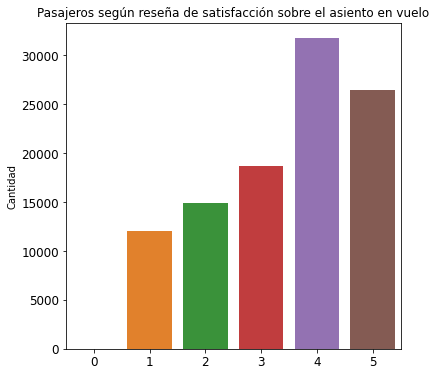

In [ ]:
#Confort de los Asientos 
from seaborn import countplot
plt.figure(figsize=(6,6))
ax = countplot(df['Seat comfort'], data=df)
plt.xticks(size =12)
plt.yticks(size =12)
plt.ylabel('Cantidad')
ax.set(xlabel=None)
plt.title("Pasajeros según reseña de satisfacción sobre el asiento en vuelo",size=12)

plt.show()

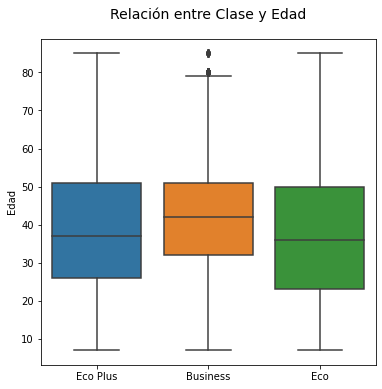

In [ ]:
#Relación entre Clase y Edad
fig, ax = plt.subplots(figsize=(6,6))
ax = sns.boxplot(x=df['Class'], y=df['Age'])
ax.set_title('Relación entre Clase y Edad', {'fontsize':14},pad=20)
ax.set(xlabel=None)
ax.set_ylabel('Edad')
plt.show()

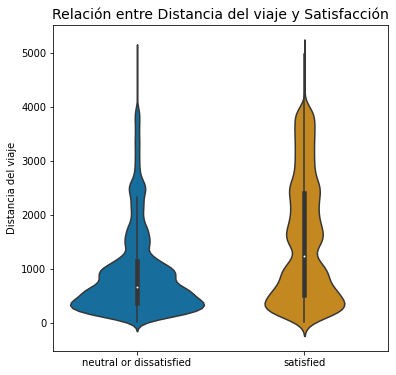

In [ ]:
#Relación entre distancia de viaje y satisfacción
plt.rcParams['figure.figsize'] = (6, 6)
sns.violinplot(x='satisfaction', y='Flight Distance',data=df, palette = 'colorblind')
plt.title('Relación entre Distancia del viaje y Satisfacción', fontsize = 14, fontweight = 30)
plt.ylabel('Distancia del viaje')
plt.xlabel('')
plt.show()

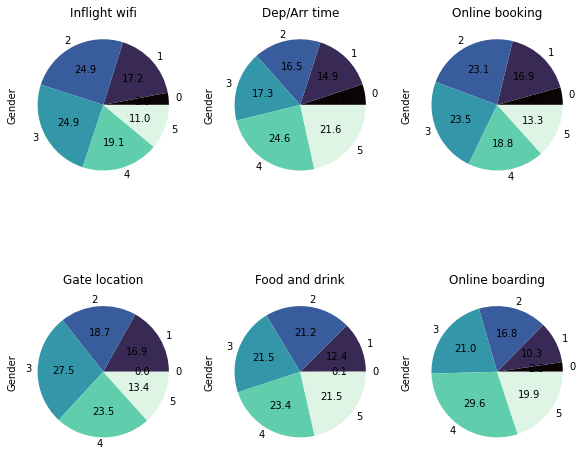

In [ ]:
# Distribución de Ciertas Variables Categóricas

fig, axarr = plt.subplots(2, 3, figsize=(10, 9))

df_1 = df.groupby(['Inflight wifi service'])['Gender'].count()
df_1.plot.pie(autopct="%.1f", cmap='mako', ax=axarr[0][0]).set(title='Inflight wifi')

df_2 = df.groupby(['Departure/Arrival time convenient'])['Gender'].count()
df_2.plot.pie(autopct="%.1f", cmap='mako', ax=axarr[0][1]).set(title='Dep/Arr time')

df_4 = df.groupby(['Ease of Online booking'])['Gender'].count()
df_4.plot.pie(autopct="%.1f", cmap='mako', ax=axarr[0][2]).set(title='Online booking')

df_5 = df.groupby(['Gate location'])['Gender'].count()
df_5.plot.pie(autopct="%.1f", cmap='mako', ax=axarr[1][0]).set(title='Gate location')

df_6 = df.groupby(['Food and drink'])['Gender'].count()
df_6.plot.pie(autopct="%.1f", cmap='mako', ax=axarr[1][1]).set(title='Food and drink')

df_7 = df.groupby(['Online boarding'])['Gender'].count()
df_7.plot.pie(autopct="%.1f", cmap='mako', ax=axarr[1][2]).set(title='Online boarding')
plt.show()
                        
                       

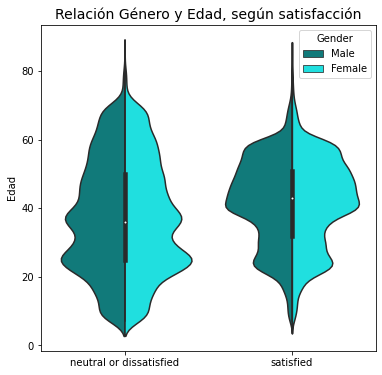

In [ ]:
#Gráfico Multivariado
plt.figure(figsize=(6,6))
sns.violinplot(x="satisfaction", y="Age", hue="Gender",
               data=df, 
               palette=['#008B8B','#00FFFF'],
               split=True,
               scale="count")
plt.title('Relación Género y Edad, según satisfacción', fontsize = 14, fontweight = 20)
plt.xlabel('')
plt.ylabel('Edad')

plt.show()

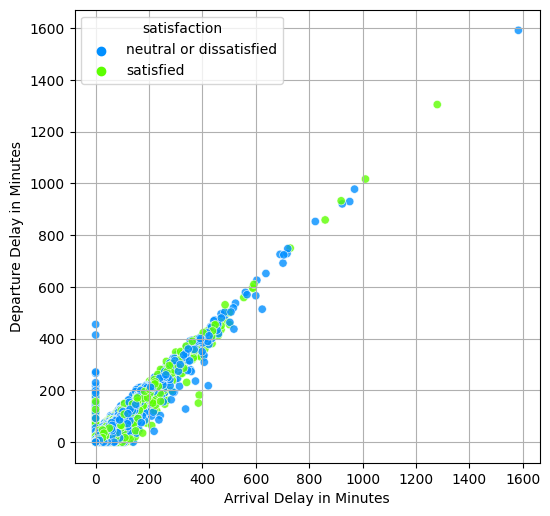

In [ ]:
#Relación entre los tiempos de espera y la satisfacción 
plt.figure(figsize=(6,6), dpi=100)

sns.scatterplot(data=df, x='Arrival Delay in Minutes',y='Departure Delay in Minutes',hue='satisfaction',palette='gist_rainbow_r', alpha=0.8)

plt.grid() # agregar una grilla

plt.show()

In [ ]:
#Gráfico Multivariado
fig = px.violin(df, y="Flight Distance", x="Class", color="satisfaction", box=True,hover_data=df.columns)
fig.show()


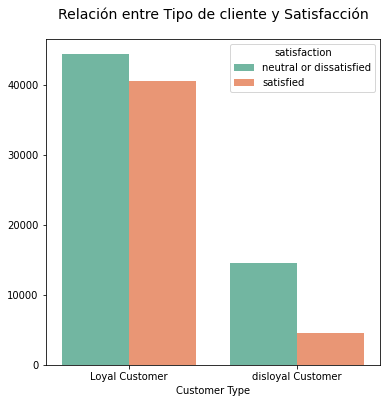

In [ ]:
#Satisfación según tipo de Cliente

fig, ax = plt.subplots(figsize=(6,6))
ax = sns.countplot(x = 'Customer Type', palette = "Set2", data = df, hue='satisfaction' ) 
ax.set_title('Relación entre Tipo de cliente y Satisfacción', {'fontsize':14},pad=20)
ax.set(ylabel=None)

plt.show()

In [ ]:
# promedio de indicadores según clase y satisfacción
grouped_dataclass = df.groupby(
                  ['satisfaction','Class']).mean()[
                  ['Inflight wifi service', 'Ease of Online booking', 'Food and drink', 
                   'Seat comfort', 'Inflight entertainment', 'On-board service','Inflight service','Cleanliness' ]]
grouped_dataclass                

Inflight wifi service  \
satisfaction            Class                             
neutral or dissatisfied Business                   2.39   
                        Eco                        2.40   
                        Eco Plus                   2.40   
satisfied               Business                   2.94   
                        Eco                        3.87   
                        Eco Plus                   3.88   

                                  Ease of Online booking  Food and drink  \
satisfaction            Class                                              
neutral or dissatisfied Business                    2.76            2.88   
                        Eco                         2.46            2.99   
                        Eco Plus                    2.56            2.92   
satisfied               Business                    2.98            3.52   
                        Eco                         3.24            3.49   
                        Eco Plus                    2.98            3.73   

                                  Seat comfort  Inflight entertainment  \
satisfaction            Class                                            
neutral or dissatisfied Business          2.99                    2.68   
                        Eco               3.06                    2.98   
                        Eco Plus          3.01                    2.89   
satisfied               Business          4.10                    4.06   
                        Eco               3.49                    3.62   
                        Eco Plus          3.72                    3.92   

                                  On-board service  Inflight service  \
satisfaction            Class                                          
neutral or dissatisfied Business              2.89              3.20   
                        Eco                   3.07              3.46   
                        Eco Plus              2.99              3.41   
satisfied               Business              4.03              4.13   
                        Eco                   3.32              3.48   
                        Eco Plus              3.23              3.32   

                                  Cleanliness  
satisfaction            Class                  
neutral or dissatisfied Business         2.72  
                        Eco              3.02  
                        Eco Plus         2.93  
satisfied               Business         3.81  
                        Eco              3.49  
                        Eco Plus         3.73

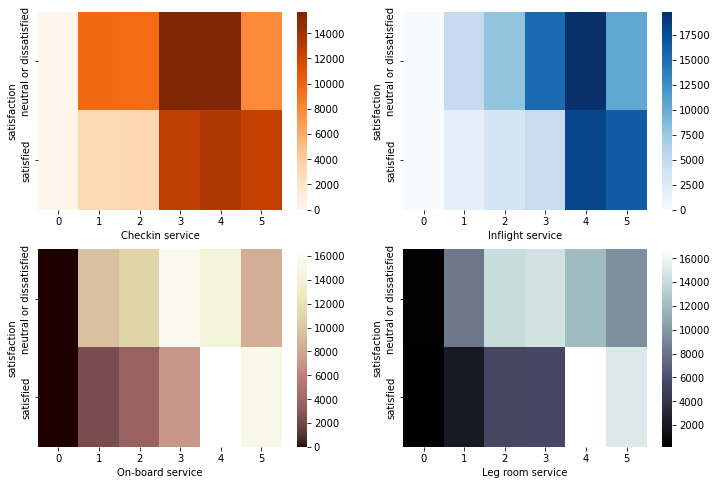

In [ ]:
# Checkin Service, Inflight Service, On-board Service, Leg-room Service

fig, axarr = plt.subplots(2, 2, figsize=(12, 8))

table1 = pd.crosstab(df['satisfaction'], df['Checkin service'])   
sns.heatmap(table1, cmap='Oranges', ax = axarr[0][0])
table2 = pd.crosstab(df['satisfaction'], df['Inflight service'])
sns.heatmap(table2, cmap='Blues', ax = axarr[0][1])
table3 = pd.crosstab(df['satisfaction'], df['On-board service'])
sns.heatmap(table3, cmap='pink', ax = axarr[1][0])
table4 = pd.crosstab(df['satisfaction'], df['Leg room service'])
sns.heatmap(table4, cmap='bone', ax = axarr[1][1])

#Entrenamiento de Modelos

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score, plot_confusion_matrix, classification_report, plot_roc_curve
from scipy import stats

import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

In [ ]:
#Selección de Variables para nuestros modelos 
features = ['trasnform_Gender', 'trasnform_Customer Type', 'Age', 'trasnform_Type of Travel', 'trasnform_Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes']
target = ['trasnform_satisfaction']

#### Split de data de Entrenamiento y de Testeo

In [ ]:
X_train = df[features]
y_train = df[target].to_numpy()
X_test = df_test[features]
y_test = df_test[target].to_numpy()

#### Normalización de las variables

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

#### Correlaciones


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



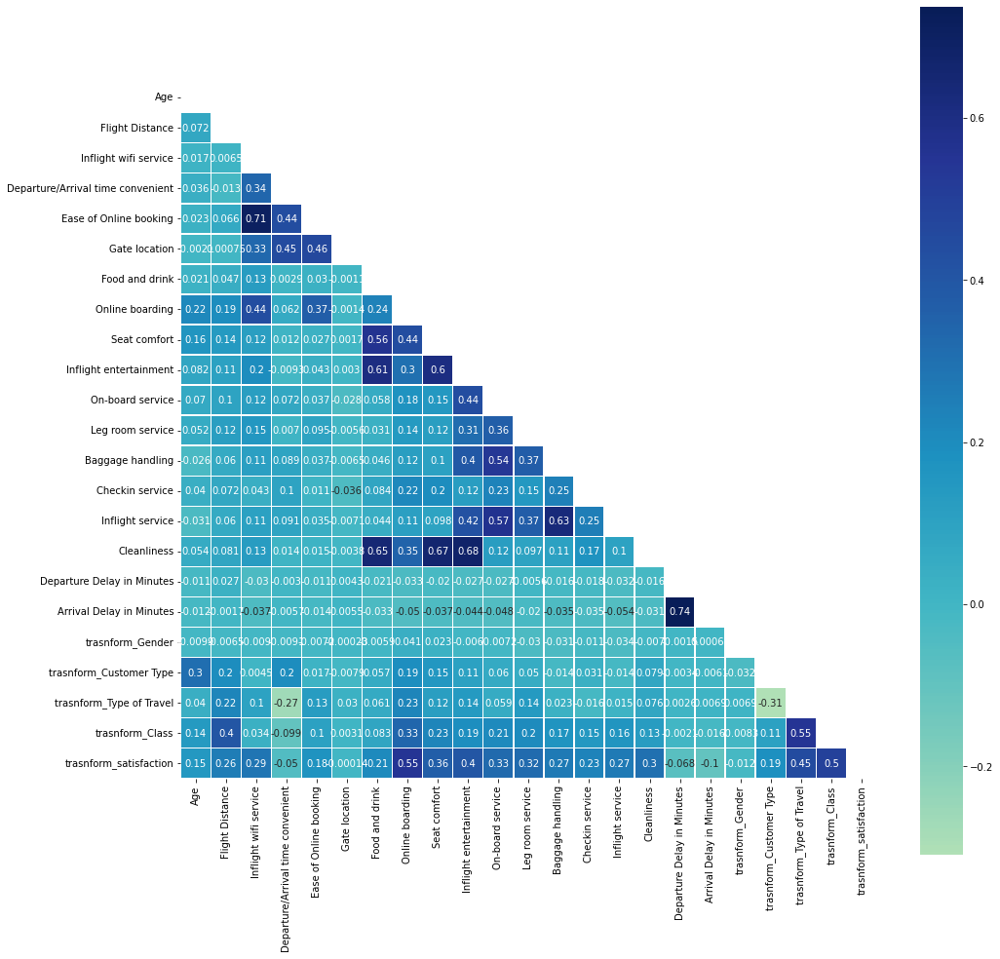

In [ ]:
corr = df.corr(method='spearman')
# Máscara para ocultar valores repetidos
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 16))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot = True, mask=mask, cmap="YlGnBu", center=0,
            square=True, linewidths=.5)

De acuerdo a nuestro gráfico de correlación, observamos que aquellas variables que explican en mayor medida la satisfación de nuestros clientes corresponden a 



1.   Online Boarding
2.   Class
3.   Type of Travel

Mientras aquellas que peor correlación tienen con nuestra variable de satisfacción son: 



*   Gate Location
*   Gender
*   Departure/Arrival Time Conveninet





### Evaluación de modelos 

In [ ]:
#Grafica un reporte de la Curva ROC en base al modelo seleccionado
import time
def run_model(model, X_train, y_train, X_test, y_test, verbose=True):
    t0=time.time()
    if verbose == False:
        model.fit(X_train,y_train.ravel(), verbose=0)
    else:
        model.fit(X_train,y_train.ravel())
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred) 
    time_taken = time.time()-t0
    print("Accuracy = {}".format(accuracy))
    print("ROC Area bajo la Curva = {}".format(roc_auc))
    print("Tiempo de Ejecución = {}".format(time_taken))
    print(classification_report(y_test,y_pred,digits=5))
    plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.Blues, normalize = 'all')
    plot_roc_curve(model, X_test, y_test)                     
    
    return model, accuracy, roc_auc, time_taken

#### Radom Forest

Accuracy = 0.9630428087465353
ROC Area bajo la Curva = 0.9607290873474874
Tiempo de Ejecución = 153.27970242500305
              precision    recall  f1-score   support

           0    0.95556   0.97969   0.96747     14573
           1    0.97318   0.94177   0.95722     11403

    accuracy                        0.96304     25976
   macro avg    0.96437   0.96073   0.96234     25976
weighted avg    0.96329   0.96304   0.96297     25976



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



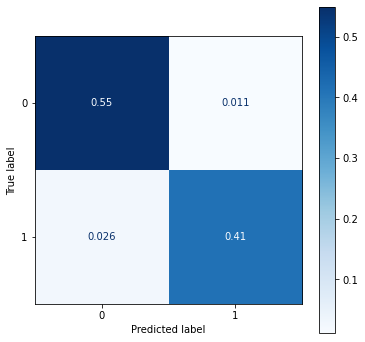

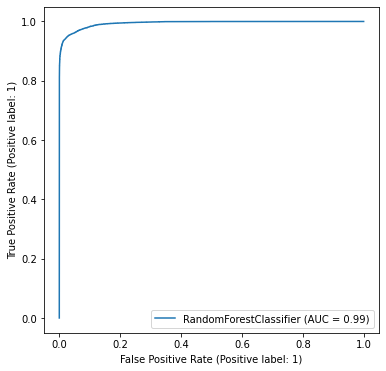

In [ ]:
params_rf = {'max_depth': 25,
         'min_samples_leaf': 1,
         'min_samples_split': 2,
         'n_estimators': 1200,
         'random_state': 42}

model_rf = RandomForestClassifier(**params_rf)
model_rf, accuracy_rf, roc_auc_rf, tt_rf = run_model(model_rf, X_train, y_train, X_test, y_test)

#### Regresión Logistica

Accuracy = 0.8716892516168772
ROC Area bajo la Curva = 0.867302948389291
Tiempo de Ejecución = 1.8938267230987549
              precision    recall  f1-score   support

           0    0.87253   0.90325   0.88762     14573
           1    0.87052   0.83136   0.85049     11403

    accuracy                        0.87169     25976
   macro avg    0.87153   0.86730   0.86906     25976
weighted avg    0.87165   0.87169   0.87132     25976



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



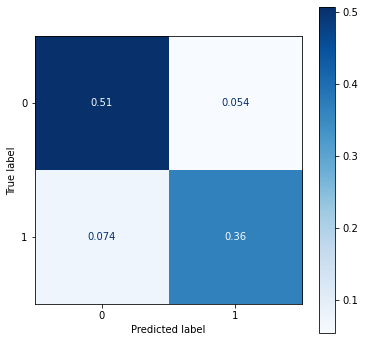

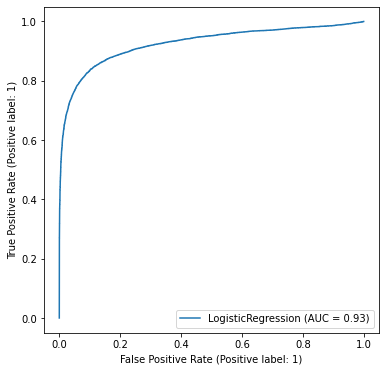

In [ ]:
from sklearn.linear_model import LogisticRegression

params_lr = {'penalty': 'elasticnet', 'l1_ratio':0.5, 'solver': 'saga'}

model_lr = LogisticRegression(**params_lr)
model_lr, accuracy_lr, roc_auc_lr, tt_lr = run_model(model_lr, X_train, y_train, X_test, y_test)

####  K-Nearest Neighbor Classifier

Accuracy = 0.9258931321219588
ROC Area bajo la Curva = 0.9192550125147796
Tiempo de Ejecución = 93.79950046539307
              precision    recall  f1-score   support

           0    0.90203   0.97365   0.93647     14573
           1    0.96252   0.86486   0.91108     11403

    accuracy                        0.92589     25976
   macro avg    0.93228   0.91926   0.92378     25976
weighted avg    0.92859   0.92589   0.92533     25976



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



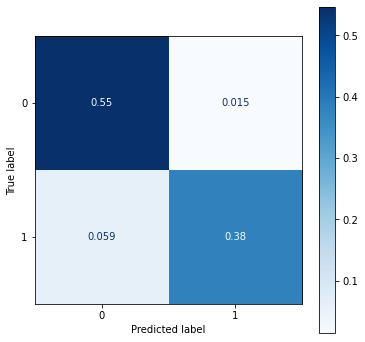

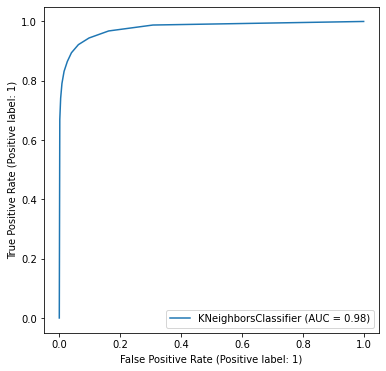

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

params_kn = {'n_neighbors':10, 'algorithm': 'kd_tree', 'n_jobs':4}

model_kn = KNeighborsClassifier(**params_kn)
model_kn, accuracy_kn, roc_auc_kn, tt_kn = run_model(model_kn, X_train, y_train, X_test, y_test)

#### Comparaciones Entre los Modelos


In [ ]:
auc_scores = [roc_auc_kn, roc_auc_lr, roc_auc_rf]
model_scores = pd.DataFrame(auc_scores, index=['KNeighbors','Regresión Logistica','Radom Forest'], columns=['AUC'])
model_scores.head()

,AUC
KNeighbors,0.92
Regresión Logistica,0.87
Radom Forest,0.96


#Comentarios sobre los Datos

*   En la mayoría de los clientes (56%) la opinión en satisfacción fue Neutral o negativa.
*   La proporción de hombres y mujeres encuestados es similar.
*   La variable edad tine una aparente distribución normal centralizada en el rango 30-60.
*   Los clientes que realizan viajes cortos (menores a 1000 km) tienden a tener un nivel de satisfacción neutral o negativa.
con respecto a las clases: 
  * la menos usada es la eco plus, la cantidad de gente que utiliza eco y business es más o menos la misma
  * los clientes de business tienen un promedio de edad levemente más elevado que quienes viajan en las otras dos
  * el tipo de clase no afecta la conformidad de las personas. 
  * los vuelos eco y eco plus son en su mayoría de menos de 1000 km, mientras que los vuelos de clase business son entre 1000 a 4000 km. 
* La demora en la partida tiene una correlación positiva muy fuerte con la demora en la llegada (r= 0,96), sin embargo no parece afectar el nivel de satisfacción de los/as pasajeros/as. 
* características de las personas disconformes: 
  * en su mayoría realizan viajes de menos de 1000 km (los conformes realizan viajes entre 1000 a 4000 km)
  * poseen entre 20 a 40 años (los conformes poseen entre 40 a 60)
  * en su mayoría son clientes no leales
* Se observa una correlación positiva entre la limpieza, la bebida y la comida,el confort de los asientos y el entretenimiento del vuelo.

---
De acuerdo a nuestro gráfico de correlación, observamos que aquellas variables que explican en mayor medida la satisfación de nuestros clientes corresponden a 



1.   Online Boarding
2.   Class
3.   Type of Travel

Mientras aquellas que peor correlación tienen con nuestra variable de satisfacción son: 



*   Gate Location
*   Gender
*   Departure/Arrival Time Conveninet

# Comentarios sobre los Modelos

Pudimos observar que tanto nuestro modelo de Random Forest como KNeighbors tuvieron una muy buena performace con Accuracy y curvas de ROC superiores a un score del 90%. 

No obstante, ramdom forest demandó doble del tiempo que el de KNeighbors, por lo que dependiendo de los recursos disponibles podríamos sacrificar el accuracy en pos de realizar cálculos y estimaciones más rápidas
